# Imports and installations

In [1]:
# Install required libraries
!pip install keras-tuner -q
!pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Importing required libraries
import random

import keras_tuner
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import tensorflow as tf
from imblearn.over_sampling import SMOTE
from kneed import KneeLocator
from mpl_toolkits import mplot3d
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (ConfusionMatrixDisplay, accuracy_score,
                             classification_report, confusion_matrix,
                             silhouette_score)
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder
from sklearn.svm import SVC

In [3]:
# Set seed for reproducibility
random.seed(42)
np.random.seed(42)

# Load and Visualize Data

In [4]:
# Read a csv dataset file into DataFrame.
data = pd.read_csv(
    "/content/drive/MyDrive/stellar_classification/star_classification.csv"
)

In [5]:
# Display first 5 rows from dataframe
data.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [6]:
# Display the dimensions dataframe
data.shape

(100000, 18)

In [7]:
# Display the column labels of the dataframe.
cols = data.columns
cols

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

In [8]:
# Display the summary of a DataFrame.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [9]:
# Check for any null values in the dataset
data.isna().any()

obj_ID         False
alpha          False
delta          False
u              False
g              False
r              False
i              False
z              False
run_ID         False
rerun_ID       False
cam_col        False
field_ID       False
spec_obj_ID    False
class          False
redshift       False
plate          False
MJD            False
fiber_ID       False
dtype: bool

In [10]:
# Count the no.of data points for each class label
data['class'].value_counts().to_frame().style.background_gradient()

,class
GALAXY,59445
STAR,21594
QSO,18961


In [11]:
# Select only the required columns from the dataset
data = data[['alpha', 'delta', 'redshift', 'u', 'g', 'r', 'i', 'z', 'class']]

In [12]:
# Display first 5 rows from dataframe
data.head()

,alpha,delta,redshift,u,g,r,i,z,class
0,135.689107,32.494632,0.634794,23.87882,22.27530,20.39501,19.16573,18.79371,GALAXY
1,144.826101,31.274185,0.779136,24.77759,22.83188,22.58444,21.16812,21.61427,GALAXY
2,142.188790,35.582444,0.644195,25.26307,22.66389,20.60976,19.34857,18.94827,GALAXY
3,338.741038,-0.402828,0.932346,22.13682,23.77656,21.61162,20.50454,19.25010,GALAXY
4,345.282593,21.183866,0.116123,19.43718,17.58028,16.49747,15.97711,15.54461,GALAXY


In [13]:
# Query out samples of each class into seperate dataframes
galaxy = data[data['class'] == 'GALAXY']
star = data[data['class'] == 'STAR']
qso = data[data['class'] == 'QSO']

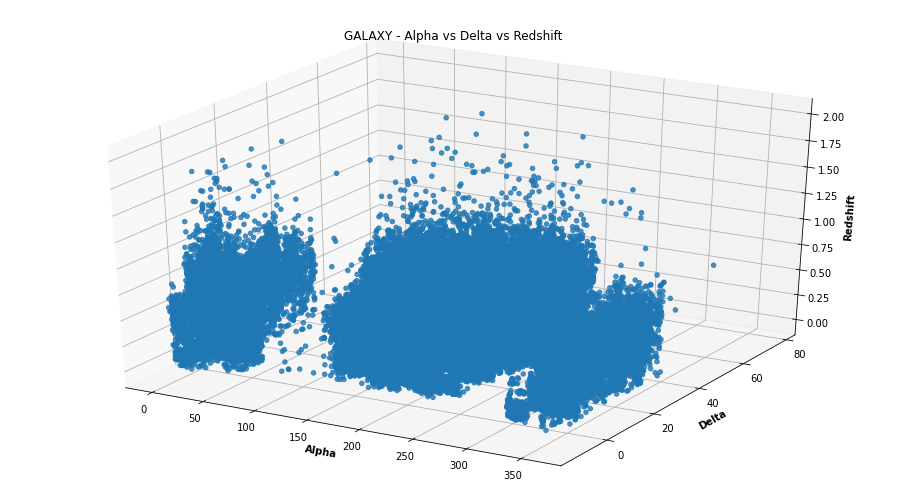

In [14]:
# Plot Alpha vs Delta vs Redshift for the GALAXY class label
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection="3d")

ax.scatter3D(galaxy['alpha'], galaxy['delta'], galaxy['redshift'], alpha=0.8)
plt.title("GALAXY - Alpha vs Delta vs Redshift")
ax.set_xlabel('Alpha', fontweight='bold')
ax.set_ylabel('Delta', fontweight='bold')
ax.set_zlabel('Redshift', fontweight='bold')
plt.show()

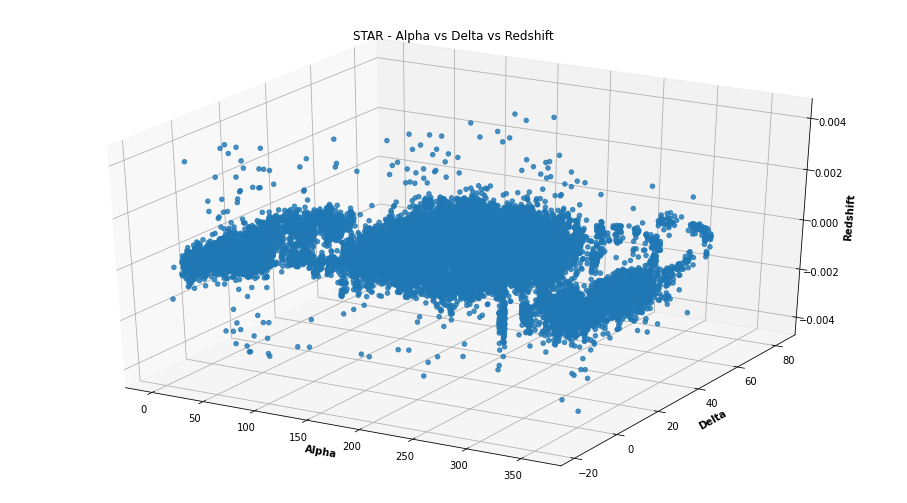

In [15]:
# Plot Alpha vs Delta vs Redshift for the STAR class label
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection="3d")

ax.scatter3D(star['alpha'], star['delta'], star['redshift'], alpha=0.8)
plt.title("STAR - Alpha vs Delta vs Redshift")
ax.set_xlabel('Alpha', fontweight='bold')
ax.set_ylabel('Delta', fontweight='bold')
ax.set_zlabel('Redshift', fontweight='bold')
plt.show()

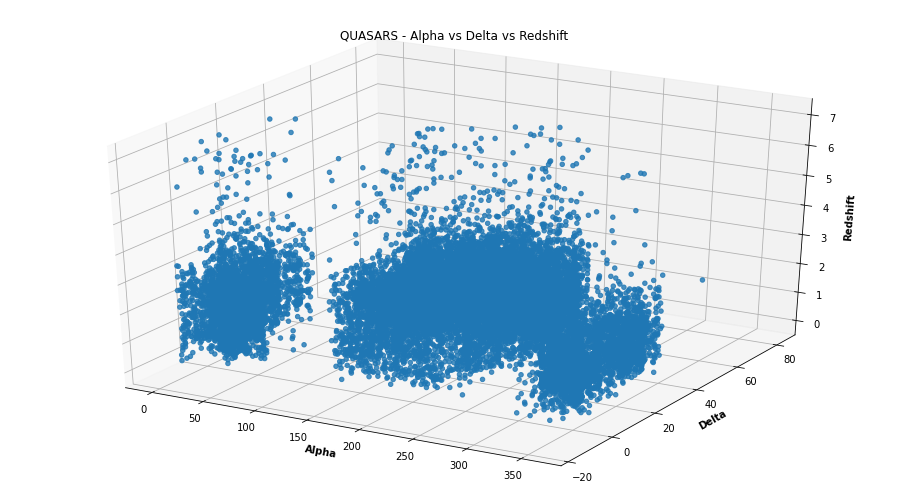

In [16]:
# Plot Alpha vs Delta vs Redshift for the QUASARS class label
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection="3d")

ax.scatter3D(qso['alpha'], qso['delta'], qso['redshift'], alpha=0.8)
plt.title("QUASARS - Alpha vs Delta vs Redshift")
ax.set_xlabel('Alpha', fontweight='bold')
ax.set_ylabel('Delta', fontweight='bold')
ax.set_zlabel('Redshift', fontweight='bold')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  This is separate from the ipykernel package so we can avoid doing imports until


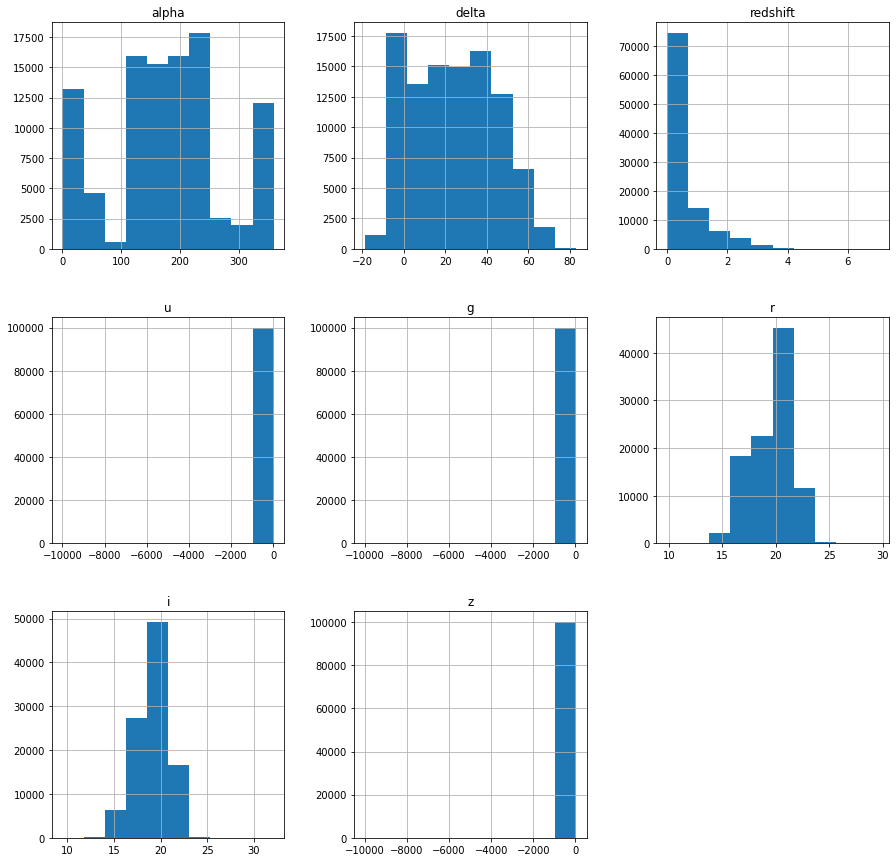

In [17]:
# Display histograms from the dataframe's columns
fig = plt.figure(figsize=(15, 15))
data.hist(ax=fig.gca())
plt.show()

# Preprocess Data

## Feature Scaling

In [18]:
# Scale each feature to a range of (0, 1)
scalar = MinMaxScaler()
data[['alpha', 'delta', 'redshift', 'u', 'g',	'r',	'i',	'z']] = scalar.fit_transform(
    data[['alpha', 'delta', 'redshift', 'u', 'g',	'r',	'i',	'z']]
)

In [19]:
# Display first 5 rows from dataframe
data.head()

,alpha,delta,redshift,u,g,r,i,z,class
0,0.376905,0.503802,0.091831,0.999113,0.999070,0.535344,0.427665,0.998944,GALAXY
1,0.402286,0.491812,0.112389,0.999202,0.999126,0.646203,0.515986,0.999225,GALAXY
2,0.394960,0.534139,0.093170,0.999251,0.999109,0.546218,0.435729,0.998959,GALAXY
3,0.940947,0.180600,0.134210,0.998939,0.999220,0.596946,0.486717,0.998990,GALAXY
4,0.959118,0.392679,0.017959,0.998670,0.998602,0.337999,0.287021,0.998620,GALAXY


## Target Labels Encoding

In [20]:
# Encode labels with value in range 0 and n_classes-1
encoder = LabelEncoder()
data['class'] = encoder.fit_transform(data['class'])

In [21]:
# Display first 5 rows from dataframe
data.head()

,alpha,delta,redshift,u,g,r,i,z,class
0,0.376905,0.503802,0.091831,0.999113,0.999070,0.535344,0.427665,0.998944,0
1,0.402286,0.491812,0.112389,0.999202,0.999126,0.646203,0.515986,0.999225,0
2,0.394960,0.534139,0.093170,0.999251,0.999109,0.546218,0.435729,0.998959,0
3,0.940947,0.180600,0.134210,0.998939,0.999220,0.596946,0.486717,0.998990,0
4,0.959118,0.392679,0.017959,0.998670,0.998602,0.337999,0.287021,0.998620,0


## Outliers Detection and Removal

In [22]:
# Display the dimensions dataframe
data.shape

(100000, 9)

In [23]:
# Detect Outliers using the Local Outlier Factor (LOF)
lof = LocalOutlierFactor()
y_ = lof.fit_predict(data.drop('class', axis=1), data['class'])

outlier_score = pd.DataFrame()
outlier_score["score"] = lof.negative_outlier_factor_

threshold = -1.5                                        
filtre = outlier_score["score"] < threshold
outlier_index = outlier_score[filtre].index.tolist()

print("Outlier Samples: ", len(outlier_index))

data.drop(outlier_index, inplace=True)

Outlier Samples:  1612


In [24]:
# Display the dimensions dataframe
data.shape

(98388, 9)

## Feature Importance

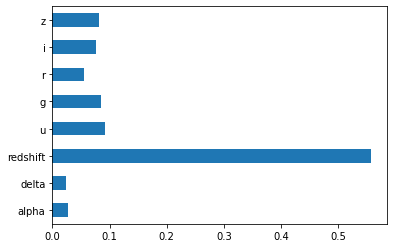

In [25]:
# Determine feature importance using an extra-trees classifier
etc = ExtraTreesClassifier()
etc.fit(data.drop('class', axis=1), data['class'])

feature_importances = pd.Series(
    etc.feature_importances_, index=data.drop('class', axis=1).columns
)
feature_importances.plot(kind='barh')
plt.show()

## Feature Selection

In [26]:
# Perform feature selection according to the k highest scores
select = SelectKBest(score_func=chi2, k=5)
z = select.fit(data.drop('class', axis=1), data['class'])

data_scores = pd.DataFrame(z.scores_)
data_columns = pd.DataFrame(data.drop('class', axis=1).columns)

feature_scores = pd.concat([data_columns, data_scores], axis=1)
feature_scores.columns = ['Features', 'Scores']

feature_scores

,Features,Scores
0,alpha,5.895393
1,delta,38.733712
2,redshift,8086.057400
3,u,0.000381
4,g,0.000279
5,r,149.610438
6,i,200.348114
7,z,0.000524


In [27]:
# Filter out the dataset using the selected features
filtered_features = list(feature_scores.nlargest(5, 'Scores')['Features'])
filtered_features.append('class')

data = data.loc[:, data.columns.isin(filtered_features)]
data.head()

,alpha,delta,redshift,r,i,class
0,0.376905,0.503802,0.091831,0.535344,0.427665,0
1,0.402286,0.491812,0.112389,0.646203,0.515986,0
2,0.394960,0.534139,0.093170,0.546218,0.435729,0
3,0.940947,0.180600,0.134210,0.596946,0.486717,0
4,0.959118,0.392679,0.017959,0.337999,0.287021,0


In [28]:
# Split the dataset into features and target labels
X = data.drop('class', axis=1)
y = data['class']

## Data Imbalance eviction

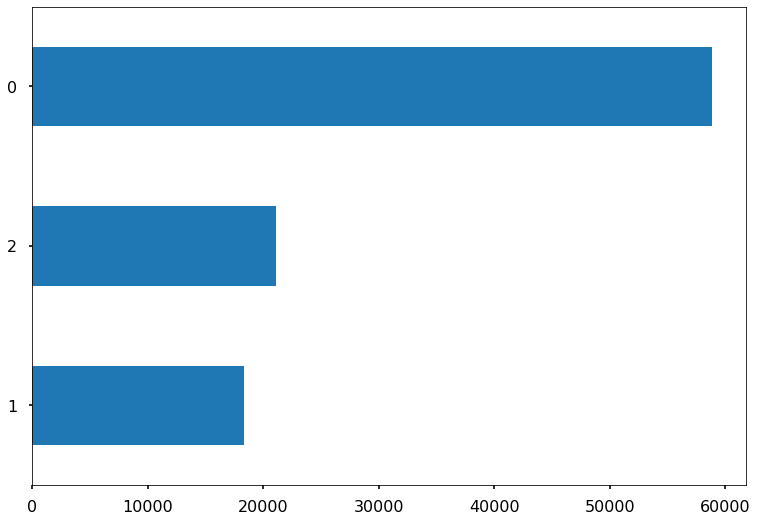

In [29]:
# Plot the frequency of the target labels
plt.style.use("seaborn-poster")
pd.Series(y).value_counts().sort_values().plot(kind='barh')

In [30]:
# According to the above plot the data is imbalenced
# Hence we use Synthetic Minority Oversampling Technique (SMOTE) to perform over-sampling
smote = SMOTE(random_state=42)
X, y = smote.fit_resample(X, y)

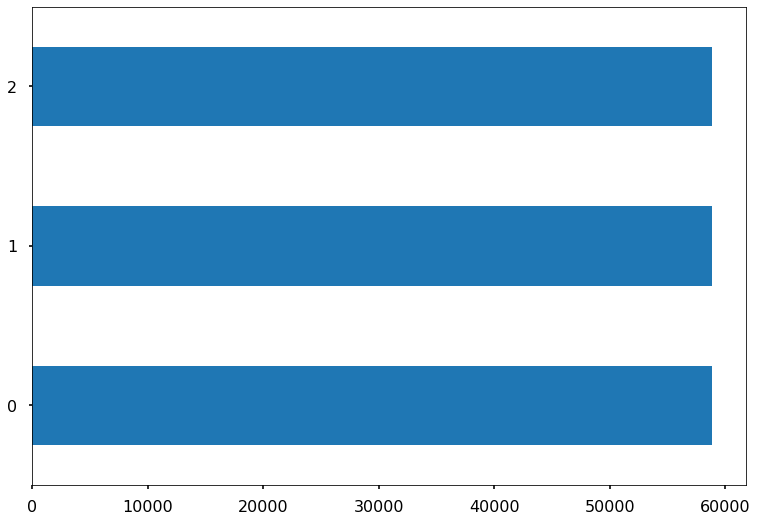

In [31]:
# Plot the frequency of the target labels after over-sampling
plt.style.use("seaborn-poster")
pd.Series(y).value_counts().sort_values().plot(kind='barh')

In [32]:
# Display first 5 rows from dataframe
X.head()

,alpha,delta,redshift,r,i
0,0.376905,0.503802,0.091831,0.535344,0.427665
1,0.402286,0.491812,0.112389,0.646203,0.515986
2,0.394960,0.534139,0.093170,0.546218,0.435729
3,0.940947,0.180600,0.134210,0.596946,0.486717
4,0.959118,0.392679,0.017959,0.337999,0.287021


In [33]:
# Display first 5 rows from dataframe
y.head()

0    0
1    0
2    0
3    0
4    0
Name: class, dtype: int64

## Split Dataset

In [34]:
# Split dataset into random train and test sub-datasets in the ratio 75 : 25
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=42, test_size=0.25
)

In [35]:
# Display the dimensions dataframe
X_train.shape

(132518, 5)

In [36]:
# Display the dimensions dataframe
X_test.shape

(44173, 5)

# Machine Learning

## Classification

### Model Pipeline

In [37]:
# Pipeline of models to train - Gaussian Naive Bayes | Logistic Regression | K-Neighbors Classifier | Support Vector Machine | Random Forest Classifier
models = {
    GaussianNB(): 'Gaussian Naive Bayes',
    LogisticRegression(solver='lbfgs', max_iter=500): "Logistic Regression",
    KNeighborsClassifier(n_neighbors=3): 'K-Neighbors Classifier',
    SVC(): "Support Vector Machine",
    RandomForestClassifier(): 'Random Forest Classifier'
}

### Model Training

In [38]:
# Train all the models in the pipeline
for model in models.keys():
    print("Training Model: ", model)
    model.fit(X_train, y_train)

Training Model:  GaussianNB()
Training Model:  LogisticRegression(max_iter=500)
Training Model:  KNeighborsClassifier(n_neighbors=3)
Training Model:  SVC()
Training Model:  RandomForestClassifier()


### Model Evaluation

In [39]:
# Display the accuracy score of the trained models
for model, name in models.items():
    accuracy_score = model.score(X_test, y_test) * 100
    print(f"Accuracy Score for {name} is : {round(accuracy_score, 4)}%")

Accuracy Score for Gaussian Naive Bayes is : 90.3765%
Accuracy Score for Logistic Regression is : 92.586%
Accuracy Score for K-Neighbors Classifier is : 95.9591%
Accuracy Score for Support Vector Machine is : 95.2641%
Accuracy Score for Random Forest Classifier is : 97.7203%


In [40]:
# Display the classification report of the trained models
for model, name in models.items():
    y_pred = model.predict(X_test)
    print(f"Classification Report for : {name}")
    print(classification_report(y_test, y_pred))
    print()

Classification Report for : Gaussian Naive Bayes
              precision    recall  f1-score   support

           0       0.89      0.82      0.85     14729
           1       0.84      0.90      0.87     14738
           2       0.99      0.99      0.99     14706

    accuracy                           0.90     44173
   macro avg       0.90      0.90      0.90     44173
weighted avg       0.90      0.90      0.90     44173


Classification Report for : Logistic Regression
              precision    recall  f1-score   support

           0       0.90      0.88      0.89     14729
           1       0.97      0.90      0.93     14738
           2       0.91      1.00      0.95     14706

    accuracy                           0.93     44173
   macro avg       0.93      0.93      0.93     44173
weighted avg       0.93      0.93      0.93     44173


Classification Report for : K-Neighbors Classifier
              precision    recall  f1-score   support

           0       0.96      0.92

Confusion Matrix for : Gaussian Naive Bayes


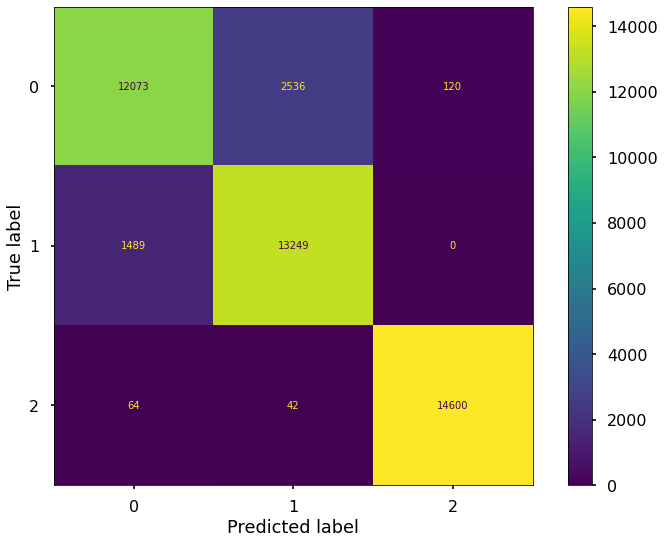



Confusion Matrix for : Logistic Regression


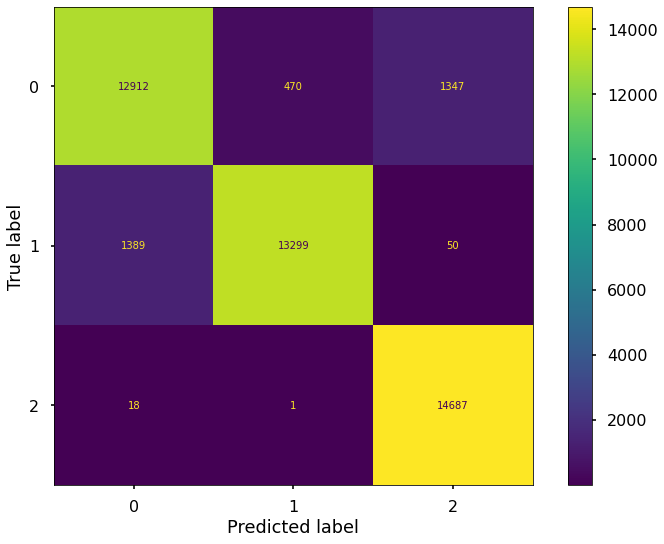



Confusion Matrix for : K-Neighbors Classifier


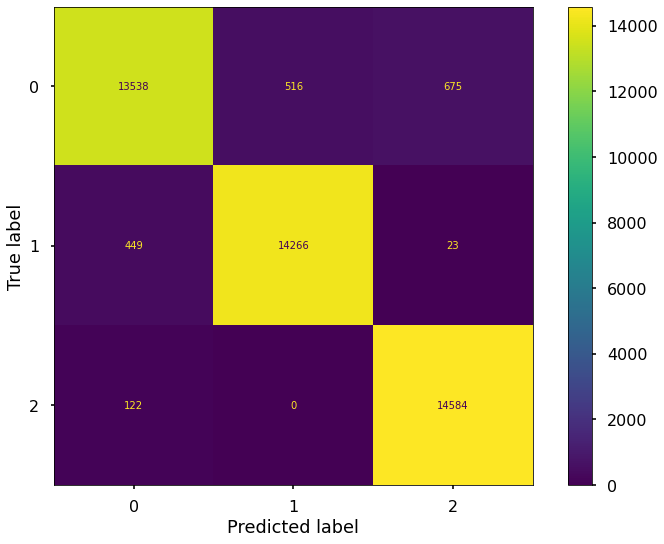



Confusion Matrix for : Support Vector Machine


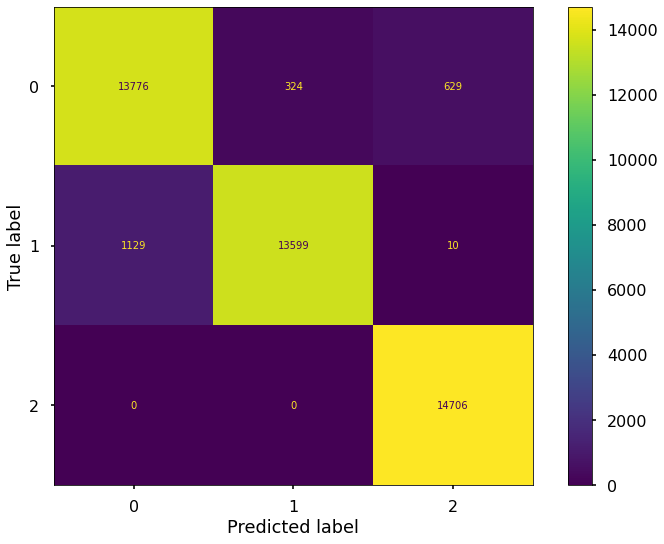



Confusion Matrix for : Random Forest Classifier


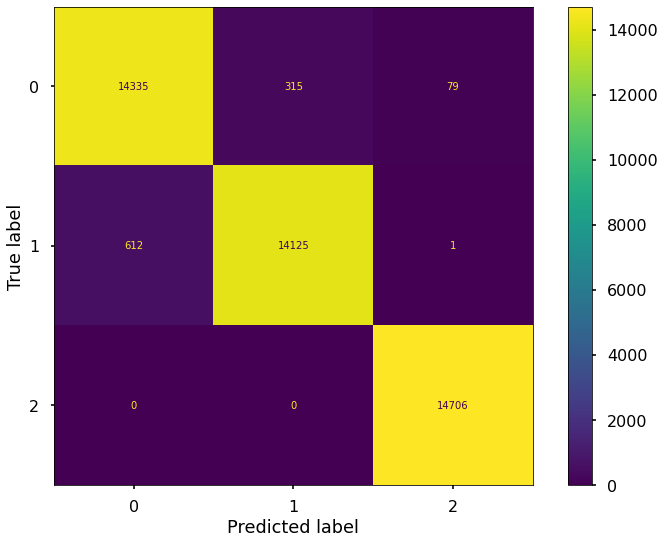

In [41]:
# Display the confusion matrix of the trained models
for model, name in models.items():
    print(f"Confusion Matrix for : {name}")
    y_pred = model.predict(X_test)
    cm_rf = confusion_matrix(y_test, y_pred)
    disp_rf = ConfusionMatrixDisplay(
        confusion_matrix=cm_rf, display_labels=model.classes_
    )
    disp_rf.plot()
    plt.show()
    print("\n")

## Clustering

### KMeans 

#### Find Number of Clusters - Elbow Method

In [42]:
# Evaluate the appropriate number of clusters using the elbow method
sum_of_squared_errors = []
for k in range(1, 6):
    print(f'Training with {k} Clusters')
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_train)
    sum_of_squared_errors.append(kmeans.inertia_)

Training with 1 Clusters
Training with 2 Clusters
Training with 3 Clusters
Training with 4 Clusters
Training with 5 Clusters


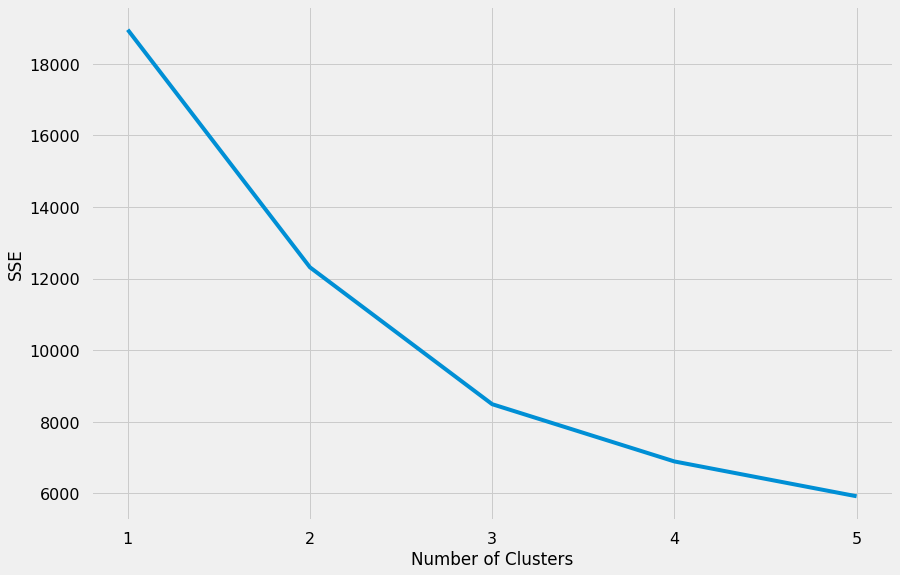

In [43]:
# Plot the Sum of Squared Errors Curve
plt.style.use("fivethirtyeight")
plt.plot(range(1, 6), sum_of_squared_errors)
plt.xticks(range(1, 6))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [44]:
# Identify the elbow point programmatically
kl = KneeLocator(
    range(1, 6), sum_of_squared_errors, curve="convex", direction="decreasing"
)

cluster_size = kl.elbow
cluster_size

3

#### Model Training

In [45]:
# Train the KMeans model
kmeans = KMeans(n_clusters=cluster_size)
kmeans.fit(X_train)

KMeans(n_clusters=3)

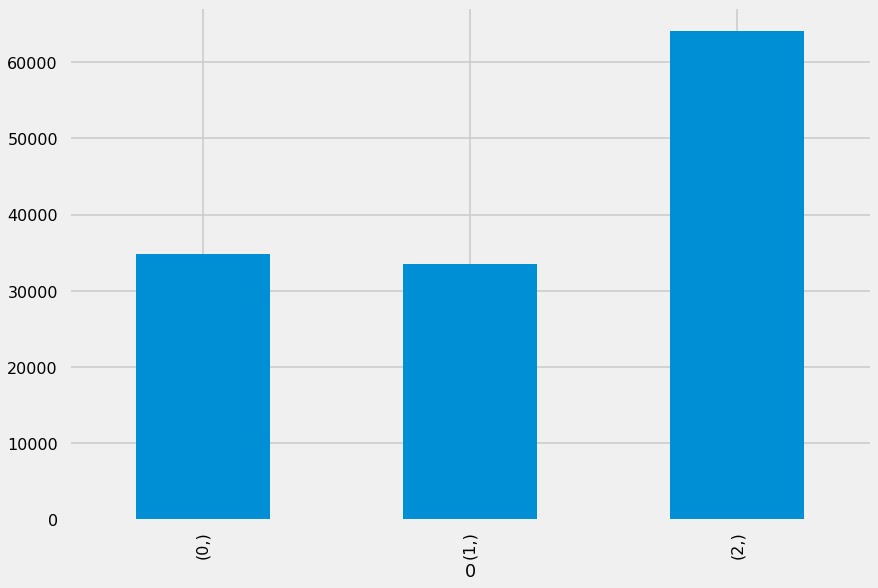

In [46]:
# Plot the number of samples in each cluster
clusters = kmeans.labels_.tolist()
plt.style.use("seaborn-poster")

pd.DataFrame(clusters).value_counts().sort_values(ascending=True).sort_index().plot(kind = 'bar')

#### Cluster Visualization

In [47]:
# Using Principal Component Analysis (PCA) to reduce the dataset into 3 principal components so that we can plot the clusters into 2D and 3D visuals
pca_ = PCA(n_components=3).fit_transform(X_train)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


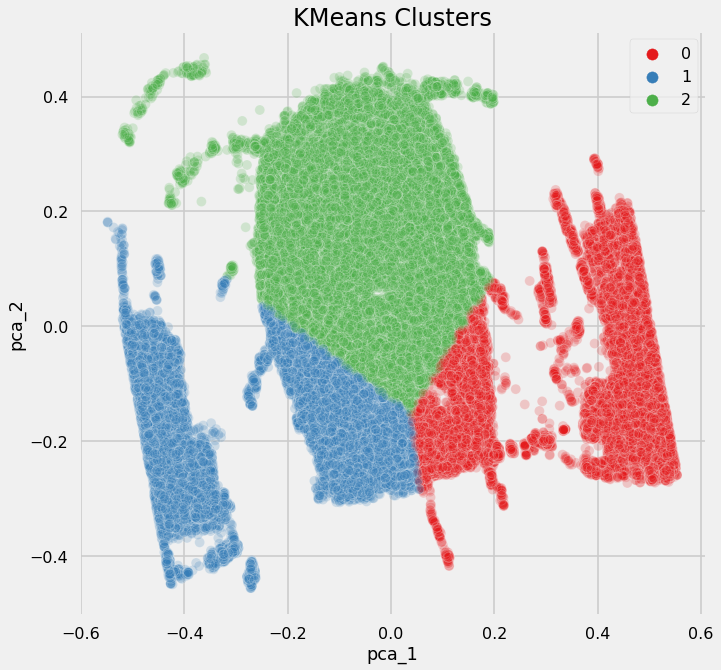

In [48]:
# 2D Plot of KMeans Clusters
plt.figure(figsize = (10, 10))
sns.scatterplot(
    pca_[:, 0], pca_[:, 1],
    hue=kmeans.labels_, 
    palette="Set1",
    s=100, alpha=0.2
).set_title('KMeans Clusters', fontsize=24)

plt.legend()
plt.ylabel('pca_2')
plt.xlabel('pca_1')
plt.show()

In [49]:
# 3D Plot of KMeans Clusters
fig = px.scatter_3d(x=pca_[:, 0], y=pca_[:, 1], z=pca_[:, 2], color=kmeans.labels_)
fig.show()

#### Silhouette Score

In [50]:
# Calculate the mean Silhouette Coefficient of all the samples to measure cluster cohesion and separation
print(f'KMeans Original: {round(silhouette_score(X_train, kmeans.labels_, metric="euclidean"), 4)}')

KMeans Original: 0.3432


# Deep Learning - Artificial Neural Network (ANN)

## One-Hot Encoding

In [51]:
# Encode categorical features as a one-hot numeric array
ohe = OneHotEncoder()

y_train_ = ohe.fit_transform(np.array(y_train).reshape(-1, 1)).toarray()
y_test_ = ohe.fit_transform(np.array(y_test).reshape(-1, 1)).toarray()
y_train_

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       ...,
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.]])

## Hyperparameter Optimization

In [52]:
# Using KerasTuner for hyperparameter tuning

# A function that creates and returns a Keras model
def build_model(hp):
    n_classes = 3
    model = tf.keras.models.Sequential()

    for i in range(hp.Int("num_layers", 1, 5)):
        model.add(
            tf.keras.layers.Dense(
                units=hp.Int(f"units_{i}", min_value=16, max_value=128),
                activation=hp.Choice("activation", ["relu", "tanh"]))
        )
        model.add(
            tf.keras.layers.Dropout(rate=hp.Float(
                f'dropout_{1}', min_value=0.0, max_value=0.5, default=0.25, step=0.05))
        )

    model.add(tf.keras.layers.Dense(n_classes))
    model.add(tf.keras.layers.Activation('sigmoid'))

    learning_rate = hp.Float("lr", min_value=1e-4,
                             max_value=1e-2, sampling="log")
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

build_model(keras_tuner.HyperParameters())

# Initialize a tuner
tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_accuracy",
    max_trials=5,
    executions_per_trial=2,
    overwrite=True,
    directory="temp",
    project_name="classification_multi",
)

# Begin the search and get the best model
tuner.search(X_train, y_train_, epochs=4, validation_data=(X_test, y_test_))

models = tuner.get_best_models(num_models=2)
best_model = models[0]
best_model.build(input_shape=(None, X_test.shape[-1]))

# Display summary of the search space
tuner.results_summary()

Trial 5 Complete [00h 02m 07s]
val_accuracy: 0.9562855362892151

Best val_accuracy So Far: 0.9585380256175995
Total elapsed time: 00h 09m 26s
Results summary
Results in temp/classification_multi
Showing 10 best trials
Trial summary
Hyperparameters:
num_layers: 4
units_0: 21
activation: tanh
dropout_1: 0.15000000000000002
lr: 0.002768554810672086
units_1: 60
units_2: 25
units_3: 43
Score: 0.9585380256175995
Trial summary
Hyperparameters:
num_layers: 2
units_0: 49
activation: tanh
dropout_1: 0.45
lr: 0.0013877861489844856
units_1: 99
units_2: 109
units_3: 105
Score: 0.9562855362892151
Trial summary
Hyperparameters:
num_layers: 3
units_0: 72
activation: tanh
dropout_1: 0.45
lr: 0.0005935157243286463
units_1: 104
units_2: 40
units_3: 73
Score: 0.955153614282608
Trial summary
Hyperparameters:
num_layers: 4
units_0: 101
activation: tanh
dropout_1: 0.35000000000000003
lr: 0.000509655304274329
units_1: 16
units_2: 16
units_3: 16
Score: 0.9535915553569794
Trial summary
Hyperparameters:
num_laye

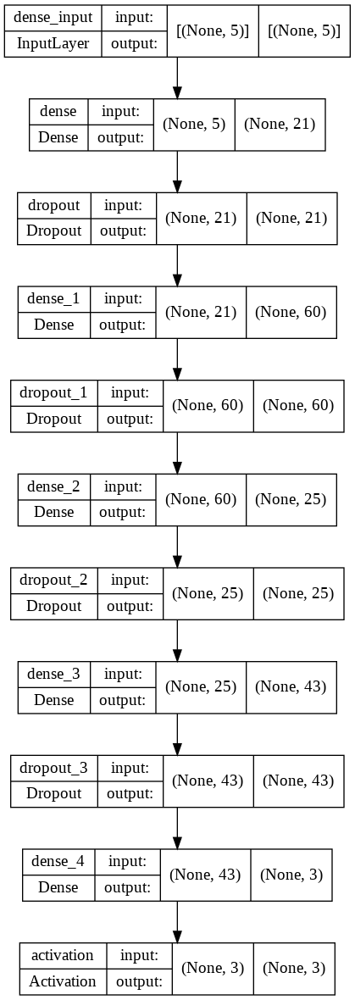

In [53]:
# Visualize keras model
tf.keras.utils.plot_model(
    best_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True
)

## ANN Training


In [54]:
# Number of training passes
epoch = 100

# Stop training when a val_loss metric stops improving
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4)

# Reduce learning rate when val_loss stops improving
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.1, patience=2, min_lr=0.00001, mode='auto'
)

# Configures and start the model for training
history = best_model.fit(
    X_train,
    y_train_,
    epochs=epoch,
    validation_data=(X_test, y_test_),
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

Epoch 1/100
4142/4142 [==============================] - 13s 3ms/step - loss: 0.1460 - accuracy: 0.9545 - val_loss: 0.1174 - val_accuracy: 0.9633 - lr: 0.0028
Epoch 2/100
4142/4142 [==============================] - 12s 3ms/step - loss: 0.1412 - accuracy: 0.9554 - val_loss: 0.1262 - val_accuracy: 0.9620 - lr: 0.0028
Epoch 3/100
4142/4142 [==============================] - 12s 3ms/step - loss: 0.1407 - accuracy: 0.9560 - val_loss: 0.1151 - val_accuracy: 0.9644 - lr: 0.0028
Epoch 4/100
4142/4142 [==============================] - 11s 3ms/step - loss: 0.1385 - accuracy: 0.9566 - val_loss: 0.1203 - val_accuracy: 0.9619 - lr: 0.0028
Epoch 5/100
4142/4142 [==============================] - 12s 3ms/step - loss: 0.1349 - accuracy: 0.9579 - val_loss: 0.1204 - val_accuracy: 0.9608 - lr: 0.0028
Epoch 6/100
4142/4142 [==============================] - 12s 3ms/step - loss: 0.1139 - accuracy: 0.9640 - val_loss: 0.1067 - val_accuracy: 0.9660 - lr: 2.7686e-04
Epoch 7/100
4142/4142 [===================

## Evaluation of ANN

In [55]:
# Training metrics of the model
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

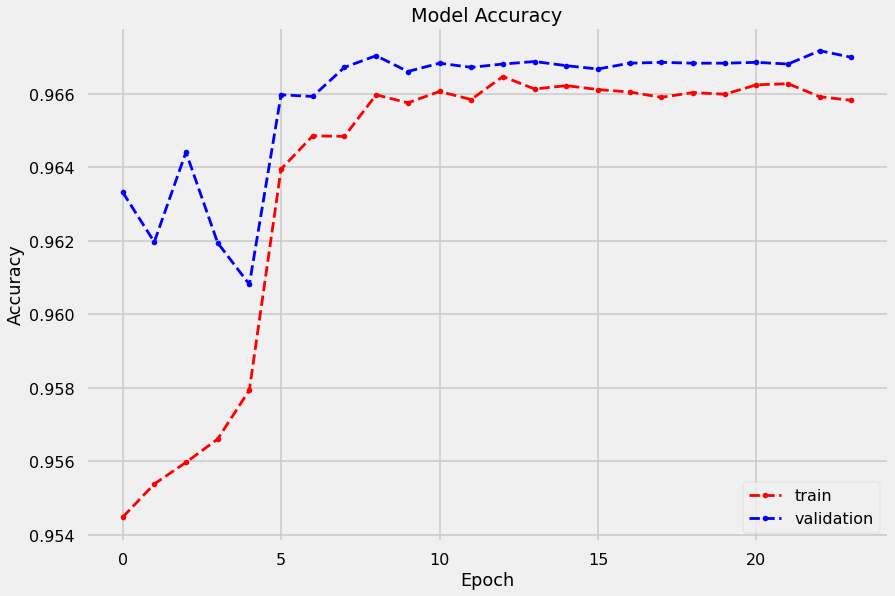

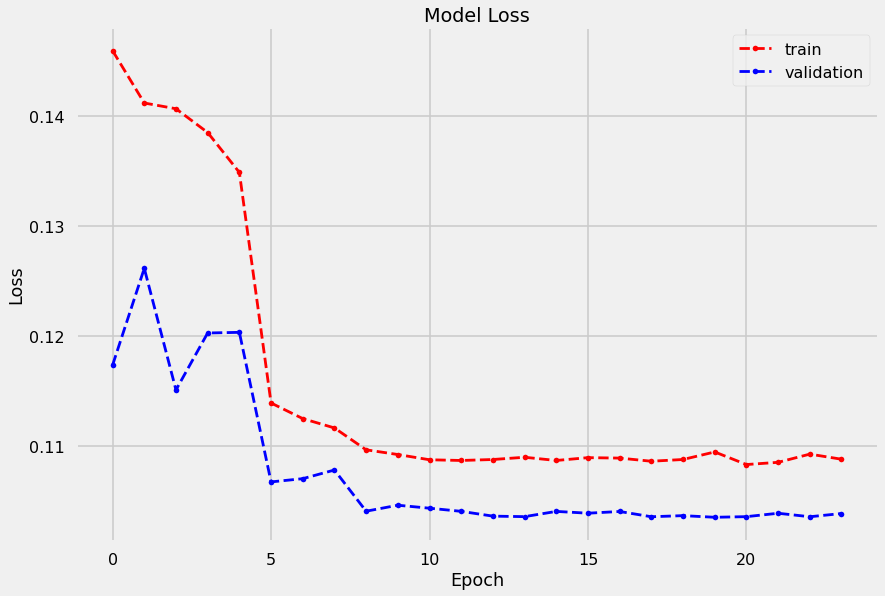

In [56]:
# Make sure the model is not overfitting or underfitting.

# Summarize history for accuracy
plt.plot(
    history.history['accuracy'], marker='.', linestyle='dashed', color='red'
)
plt.plot(
    history.history['val_accuracy'], marker='.', linestyle='dashed', color='blue'
)
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

print()

# Summarize history for loss
plt.plot(history.history['loss'], marker='.', linestyle='dashed', color='red')
plt.plot(
    history.history['val_loss'], marker='.', linestyle='dashed', color='blue'
)
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [57]:
# Evaluate the trained model with test data
test_loss, test_acc = best_model.evaluate(X_test, y_test_)

1381/1381 [==============================] - 2s 2ms/step - loss: 0.1039 - accuracy: 0.9670


In [58]:
# Print test-loss and test-accuracy
test_loss, test_acc * 100

(0.1038670465350151, 96.69933915138245)

In [62]:
y_test_

array([[0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       ...,
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.]])

In [67]:
# Predict for all the testing samples
pred = np.argmax(best_model.predict(X_test), axis=1)

In [69]:
# Display the classification report of the trained model
cr_ann = classification_report(y_test, pred)
print(f"Classification Report: \n{cr_ann}")
cr_ann = classification_report(y_test, pred, output_dict=True)

Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     14729
           1       0.97      0.94      0.95     14738
           2       0.99      1.00      1.00     14706

    accuracy                           0.97     44173
   macro avg       0.97      0.97      0.97     44173
weighted avg       0.97      0.97      0.97     44173



Confusion Matrix:


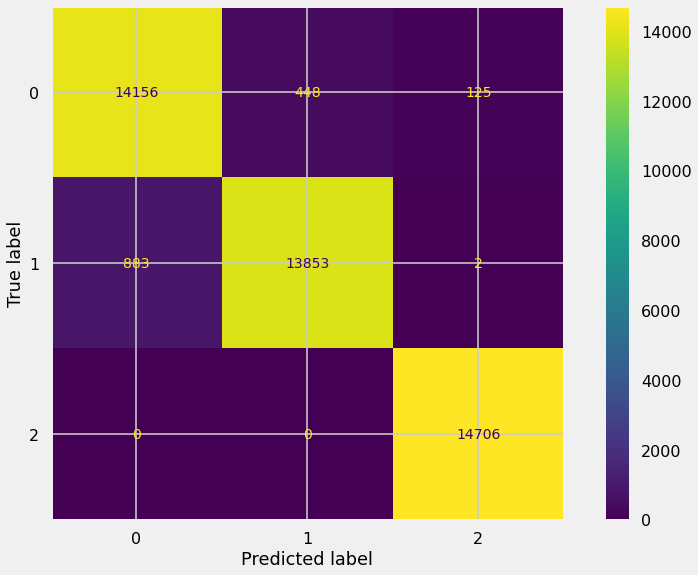

In [71]:
# Display the confusion matrix of the trained model
print("Confusion Matrix:")
cm_ann = confusion_matrix(y_test, pred)
disp_ann = ConfusionMatrixDisplay(
    confusion_matrix=cm_ann
)
disp_ann.plot()
plt.show()